In [ ]:
%run preparation.ipynb

In [2]:
image = load_image('ref.bmp')

In [3]:
indices = [(300, 380), (400, 470), (457, 767), (288, 786), (1071, 173), (1151, 321)]

lower bound: [22, 67, 220]
upper bound: [67, 158, 255]


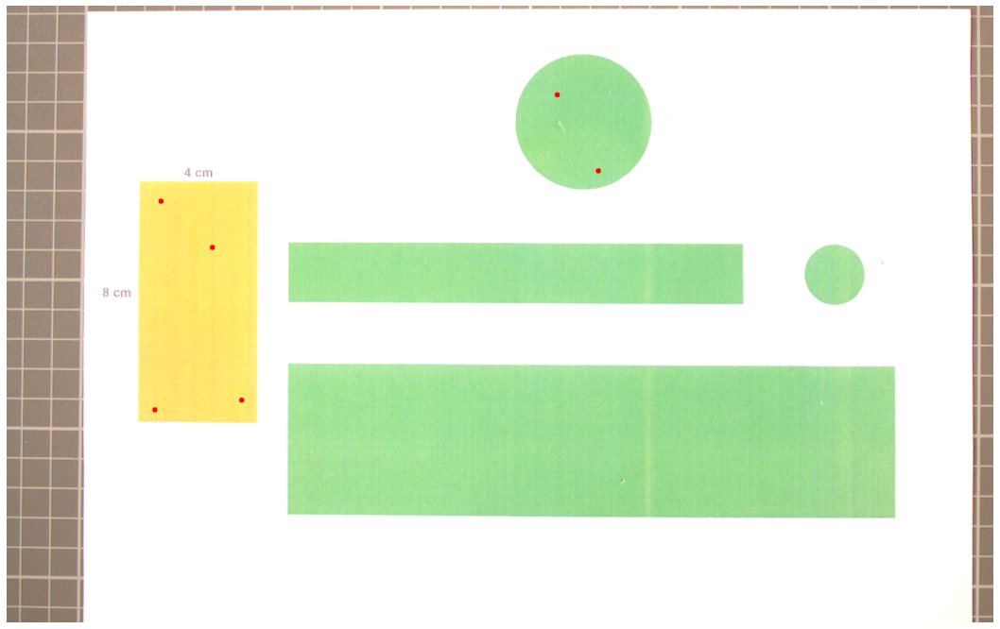

In [4]:
lower_bound, upper_bound = find_hsv_bounds(image, indices, 5)

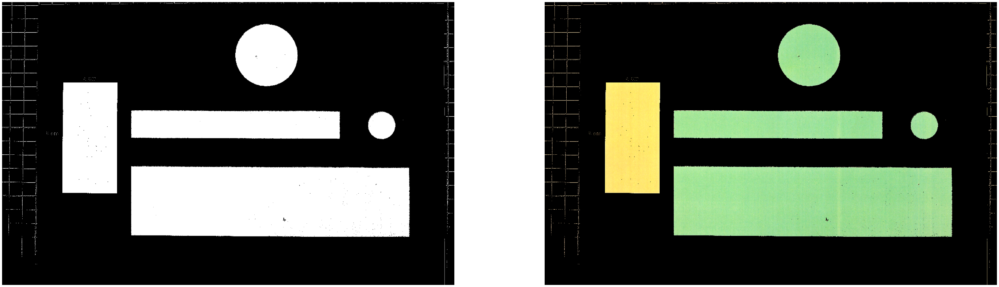

In [5]:
mask = create_hsv_mask(image, lower_bound, upper_bound, tolerance=10)
plot_images(mask, apply_mask(image, mask))

In [6]:
contours = get_contours(mask, number_of_contours=5, min_area=1)


Found 601 contour(s). Returning sorted from largest: 5


In [7]:
for contour in contours:
    print(cv2.contourArea(contour))

344670.0
107718.0
102030.0
54187.0
10350.5


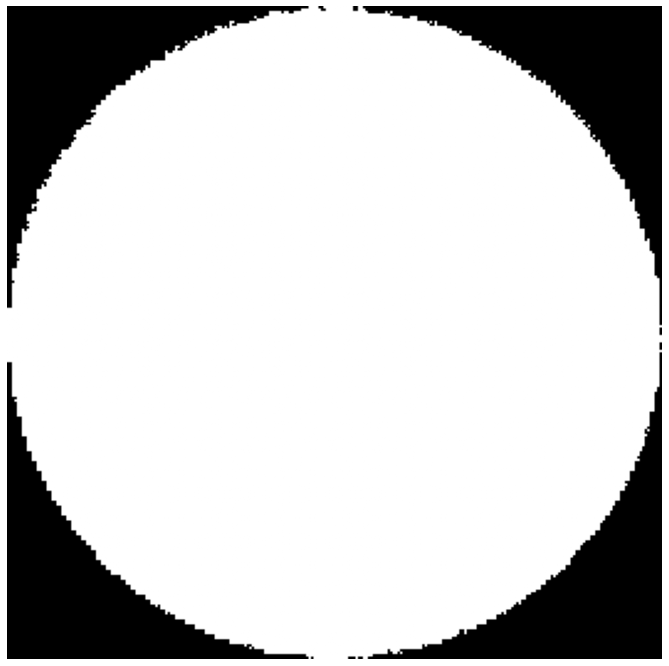

In [8]:
plot_images(get_image_from_contour(contours, image, True)[3])

In [9]:
mask = get_image_from_contour(contours, image, False)[0]

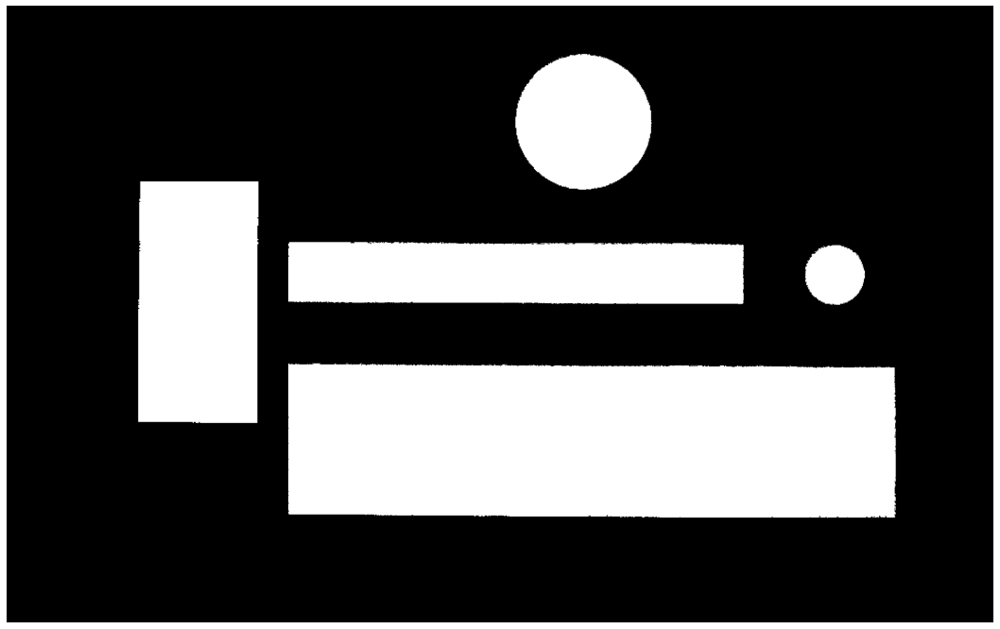

In [10]:
plot_images(mask)

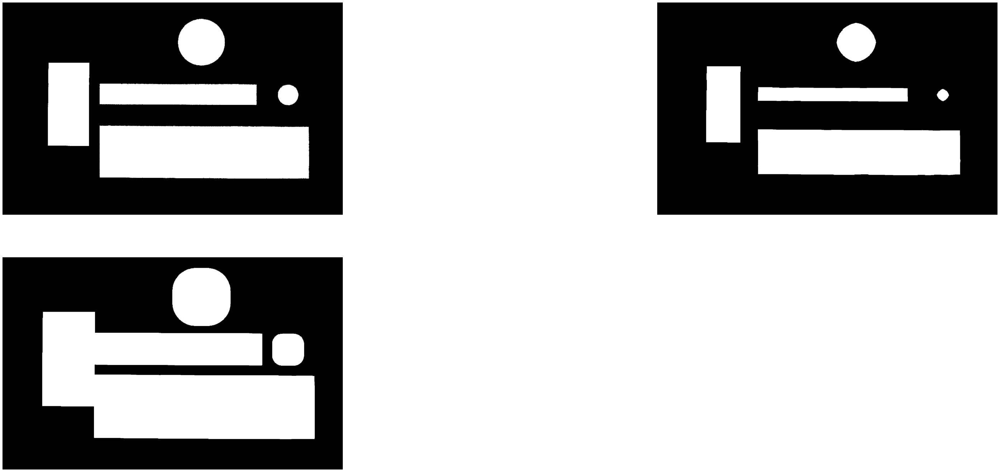

In [11]:
mask_erode = erode(mask, get_square_kernel(40))
mask_dilate = dilate(mask, get_square_kernel(65))
plot_images(mask, mask_erode, mask_dilate)

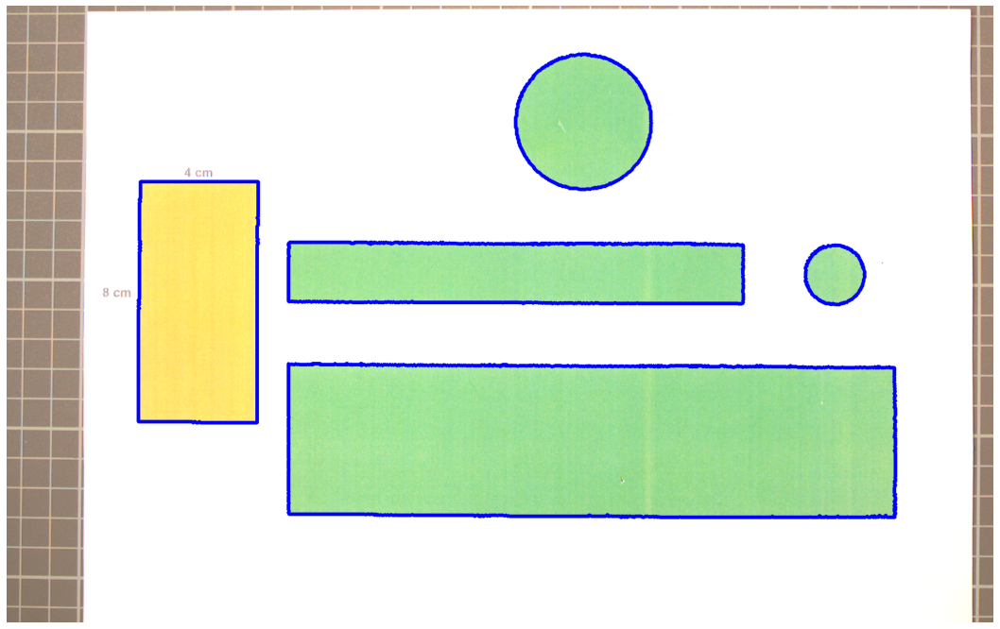

In [12]:
plot_images(highlight_contour(contours, image))

In [13]:
print(contours[0])

[[[548 696]]

 [[548 799]]

 [[549 800]]

 ...

 [[551 698]]

 [[550 697]]

 [[549 697]]]


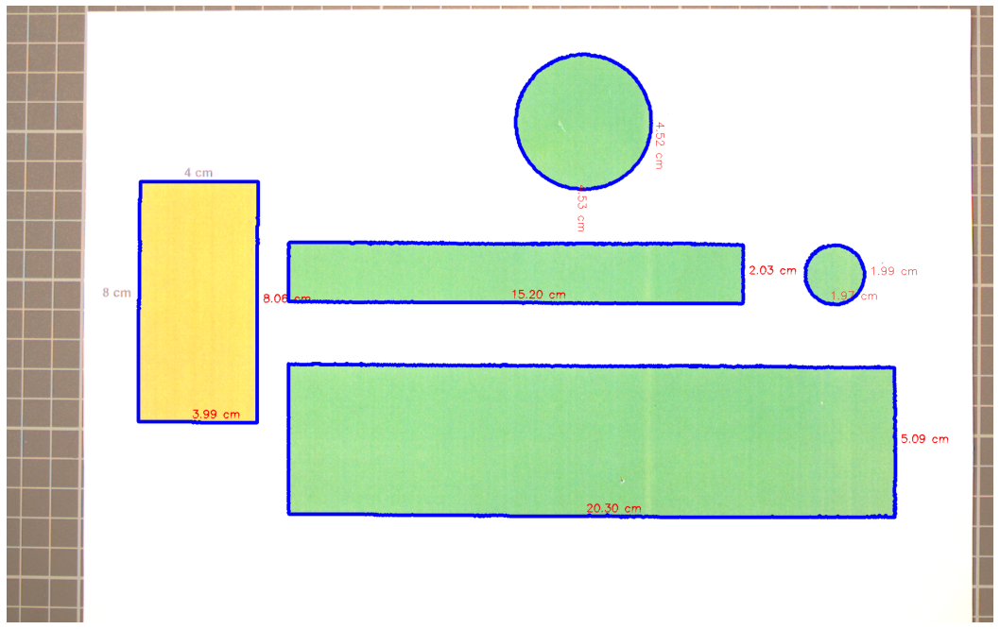

In [14]:
plot_images(get_rect_sizes(image, contours, 0.017167381974248927))

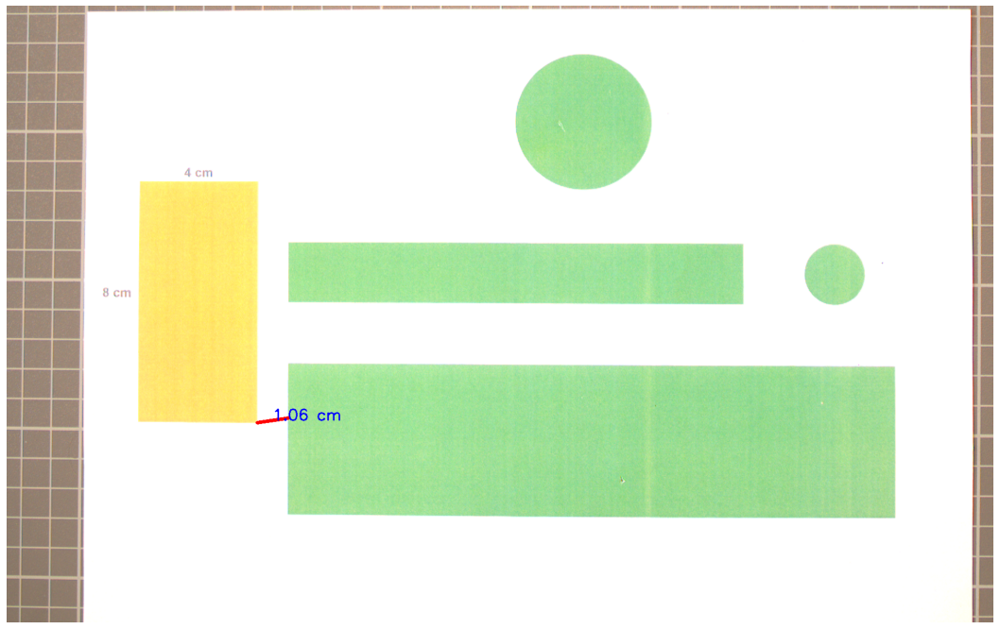

In [15]:
dist_cont_image, distance, point_a, point_b = get_contours_distances(image, [contours[0], contours[1]], 0.017167381974248927) 
plot_images(dist_cont_image)

In [16]:
get_contour_area(contours[2], image, 0.0002889)

29.476466999999996

In [17]:
area = get_contour_area(contours[2], image, 0.0002889)
contour_area_image = get_rect_sizes(image, [contours[2]], 0.017167381974248927)
contour_area_image = draw_number(contour_area_image, area, get_center(contours[2]), 'cm^2')

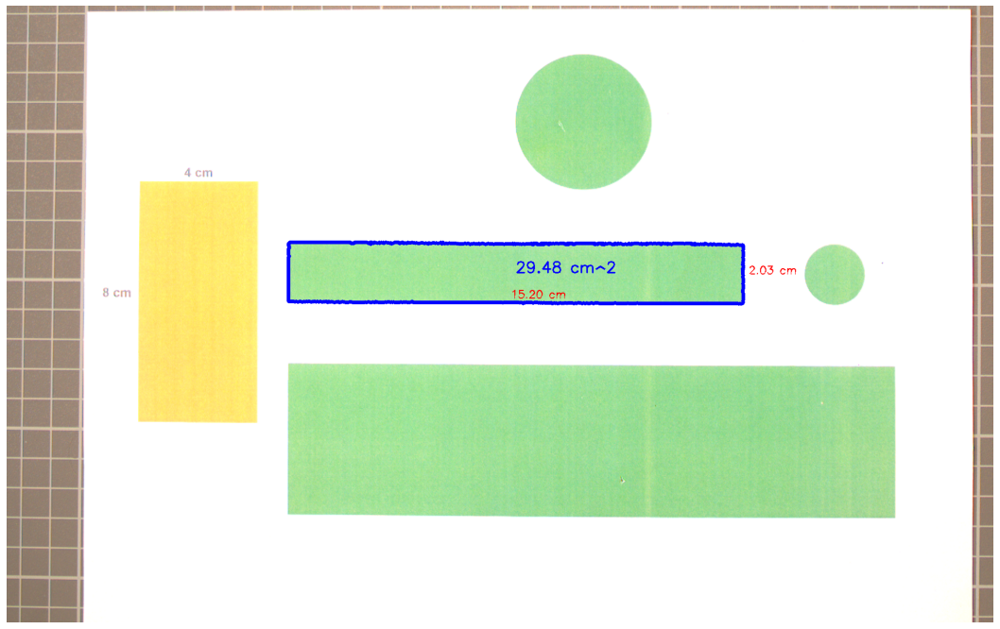

In [18]:
plot_images(contour_area_image)

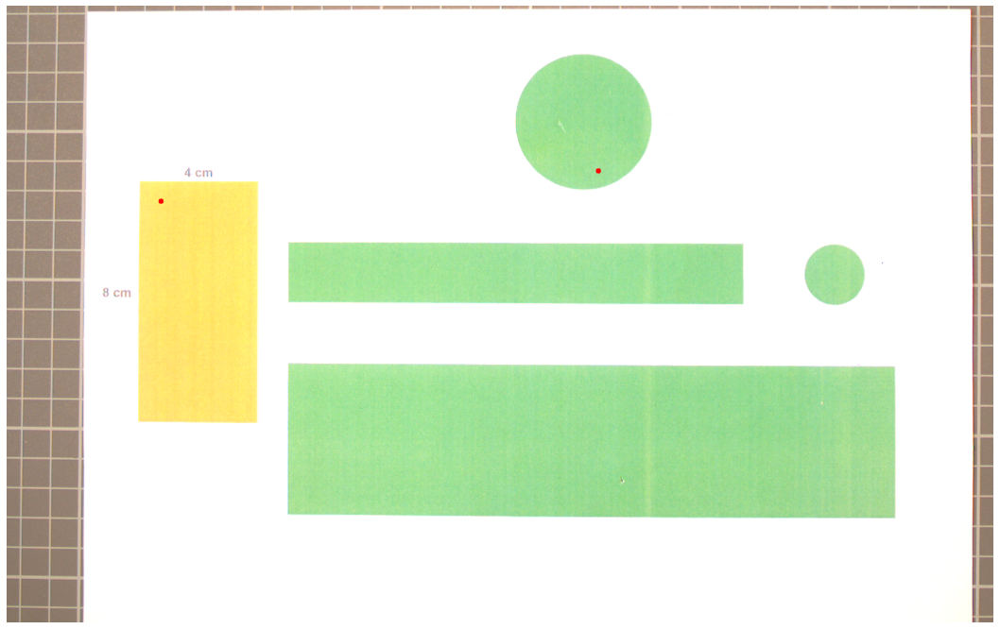

In [19]:
contour = get_contour_containing_point(contours, image, [(1151, 321), (300, 380)])

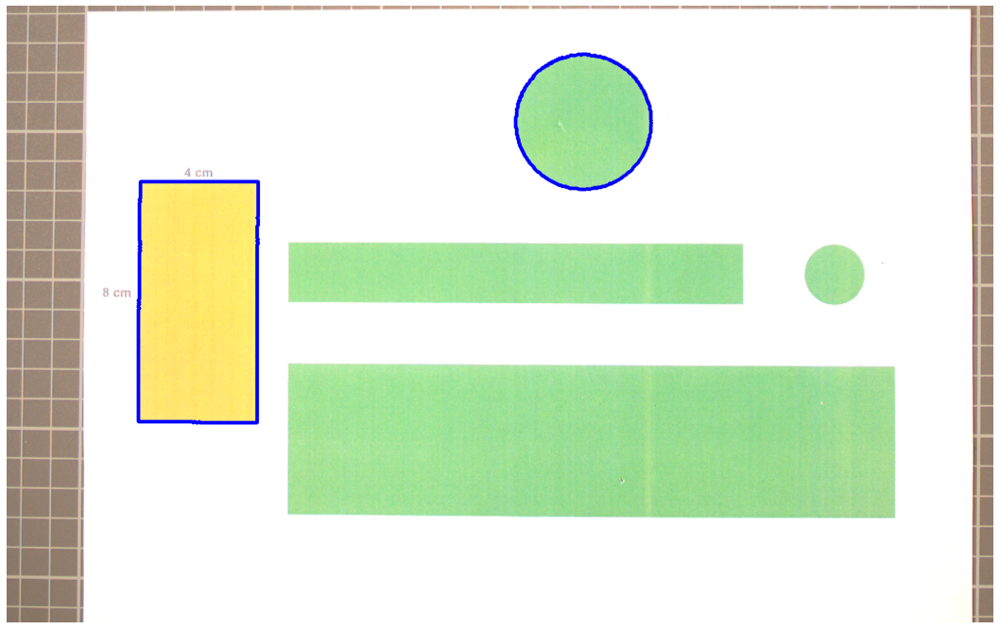

In [20]:
plot_images(highlight_contour(contour, image))

In [21]:
key_a = load_image('key_a.png')
key_a = to_gray(key_a)
contour_a = get_contours(key_a, 1)[0]

Found 2 contour(s). Returning sorted from largest: 1


In [22]:
key_b = load_image('key_b.png')
key_b = to_gray(key_b)
key_b = segmentation_one_threshold(key_b, 100)
contour_b = get_contours(key_b, 1)[0]

Found 1 contour(s). Returning sorted from largest: 1


In [23]:
get_contour_similarity_difference(contour_a, contour_b, key_a, key_b)

0.007044904407763629

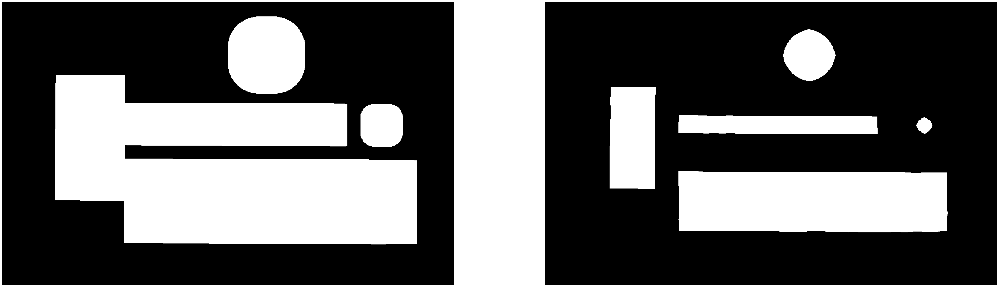

In [24]:
plot_images(mask_union(mask_erode, mask_dilate), mask_intersect(mask_erode, mask_dilate))

In [25]:
sorted_contours = sort_contours_by_similarity(contours[0], contours, image)

In [26]:
for a in sorted_contours:
    print(a[0])

0.0
0.2633208247586665
0.5102271088989061
1.1046547729663287
1.1417733494286206


In [27]:
get_contour_similarity_difference(contours[1], contours[0], image, image)

0.5102271088989061

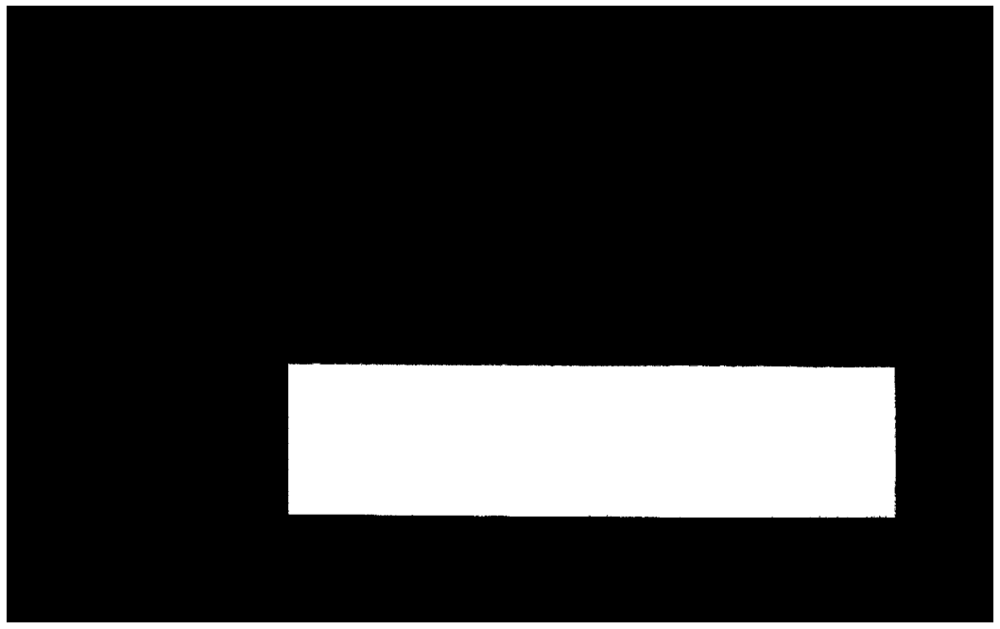

In [28]:
plot_images(get_image_from_contour([contours[0]], image, False)[0])

In [29]:
x = {1: 2, 3: 4, 4: 3, 2: 1, 0: 0}
x.items()

dict_items([(1, 2), (3, 4), (4, 3), (2, 1), (0, 0)])